## Packages

- `util` includes functions of drawing bounding boxes

In [1]:
import tensorflow as tf
import tensorflow_hub as hub

import matplotlib.pyplot as plt
import numpy as np
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

from PIL import Image, ImageColor, ImageDraw, ImageFont, ImageOps
import time
from util import *

print(tf.__version__)

2.10.0


### Download the model from Tensorflow Hub

Tensorflow Hub is a repository of trained machine learning models which you can reuse in your own projects. 
- You can see the domains covered [here](https://tfhub.dev/) and its subcategories. 
- For this lab, you will want to look at the [image object detection subcategory](https://tfhub.dev/s?module-type=image-object-detection). 
- You can select a model to see more information about it and copy the URL so you can download it to your workspace. 


* [ssd + mobilenet V2](https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2) small and fast.
* [FasterRCNN + InceptionResNet V2](https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1): high accuracy

In [2]:
# ssd mobilenet version 2
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"

# resnet version 2 
#module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

model = hub.load(module_handle)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Metal device set to: Apple M2


2022-10-13 15:07:19.474010: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-10-13 15:07:19.474462: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2022-10-13 15:07:19.530852: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-10-13 15:07:19.537682: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


#### Choose the default signature

As before, you can check the available signatures using `.signature.keys()`

In [3]:
# take a look at the available signatures for this particular model
model.signatures.keys()

KeysView(_SignatureMap({'default': <ConcreteFunction pruned(images) at 0x1059B5D60>}))

In [4]:
# choose the 'default' signature the object detector.
detector = model.signatures['default']

### download_and_resize_image


In [24]:
def display_image(image, save_img=True, img_name=None):
    """
    Displays an image inside the notebook.
    This is used by download_and_resize_image()
    """
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)
    if save_img:
        plt.savefig(img_name, bbox_inches='tight')
    

def download_and_resize_image(url, new_width=256, new_height=256, display=False, down_to_cur_directory=False):
    '''
    Fetches an image online, resizes it and saves it locally.
    
    Args:
        url (string) -- link to the image
        new_width (int) -- size in pixels used for resizing the width of the image
        new_height (int) -- size in pixels used for resizing the length of the image
        
    Returns:
        (string) -- path to the saved image
    '''
    if down_to_cur_directory:
        filename = 'img/' + url.split('/')[-1] # download to cur_directory 
    else:
        # create a temporary file ending with ".jpg"
        _, filename = tempfile.mkstemp(suffix=".jpg")

    
    # opens the given URL
    response = urlopen(url)
    
    # reads the image fetched from the URL
    image_data = response.read()
    
    # puts the image data in memory buffer
    image_data = BytesIO(image_data)
    
    # opens the image
    pil_image = Image.open(image_data)
    
    # resizes the image. will crop if aspect ratio is different.
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    
    # converts to the RGB colorspace
    pil_image_rgb = pil_image.convert("RGB")
    
    # saves the image to the temporary file created earlier
    pil_image_rgb.save(filename, format="JPEG", quality=90)
    
    print("Image downloaded to %s." % filename)
    
    if display:
        display_image(pil_image)

    return filename

### Select and load an image
Load a public image from Open Images v4, save locally, and display.

/var/folders/yh/_x7knk010_jf8mn6y34t0cnc0000gn/T/ipykernel_48875/3063475866.py:42: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to Naxos_Taverna.jpg.


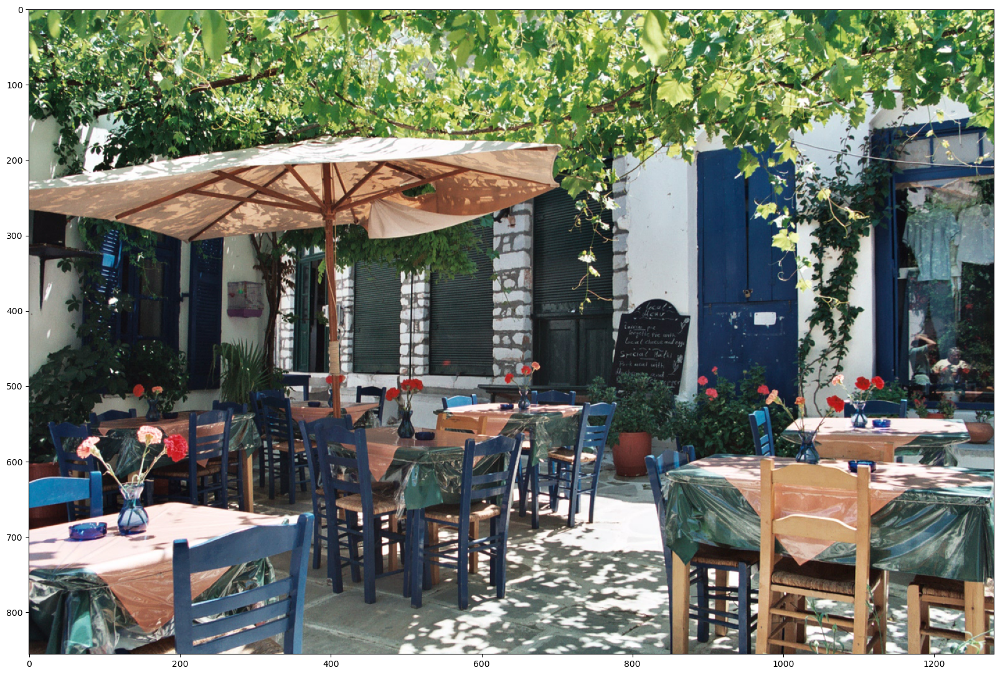

In [18]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  #@param
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True, True)

In [23]:
def load_img(path):
    '''
    Loads a JPEG image and converts it to a tensor.
    
    Args:
        path (string) -- path to a locally saved JPEG image
    
    Returns:
        (tensor) -- an image tensor
    '''
    
    # read the file
    img = tf.io.read_file(path)
    
    # convert to a tensor
    img = tf.image.decode_jpeg(img, channels=3)
    
    return img


def run_detector(detector, path, save_img=False, img_name=None):
    '''
    Runs inference on a local file using an object detection model.
    
    Args:
        detector (model) -- an object detection model loaded from TF Hub
        path (string) -- path to an image saved locally
    '''
    
    # load an image tensor from a local file path
    img = load_img(path)

    # add a batch dimension in front of the tensor
    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

    # run inference using the model
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    # save the results in a dictionary
    result = {key:value.numpy() for key,value in result.items()}

    # print results
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    # draw predicted boxes over the image
    image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

    # display the image
    display_image(image_with_boxes, save_img, img_name)
    
    return result

In [27]:
def run_detectore_from_local_img(path, new_dimension=(480, 640), save_img=False, img_name=None):
    
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)

    img = tf.image.resize(img, new_dimension)

    img =  tf.cast(img, np.uint8).numpy()
    
    converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()
    result = {key:value.numpy() for key,value in result.items()}

    # print results
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    # draw predicted boxes over the image
    image_with_boxes = draw_boxes(img, result["detection_boxes"],result["detection_class_entities"],
                                  result["detection_scores"])

    # display the image
    display_image(image_with_boxes, save_img, img_name)
    
    return image_with_boxes

Found 100 objects.
Inference time:  2.5364761352539062
Font not found, using default font.


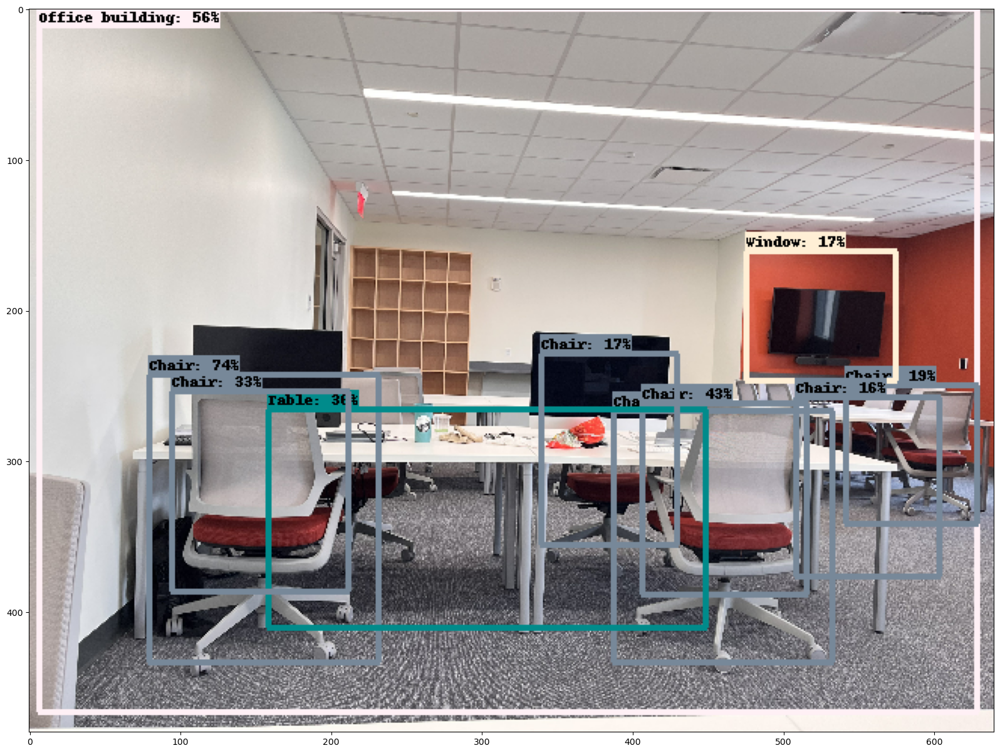

In [29]:
image_with_boxes = run_detectore_from_local_img('.img/office.jpeg', save_img=True, img_name='img/office_result.jpg')

Found 100 objects.
Inference time:  2.5030367374420166
Font not found, using default font.


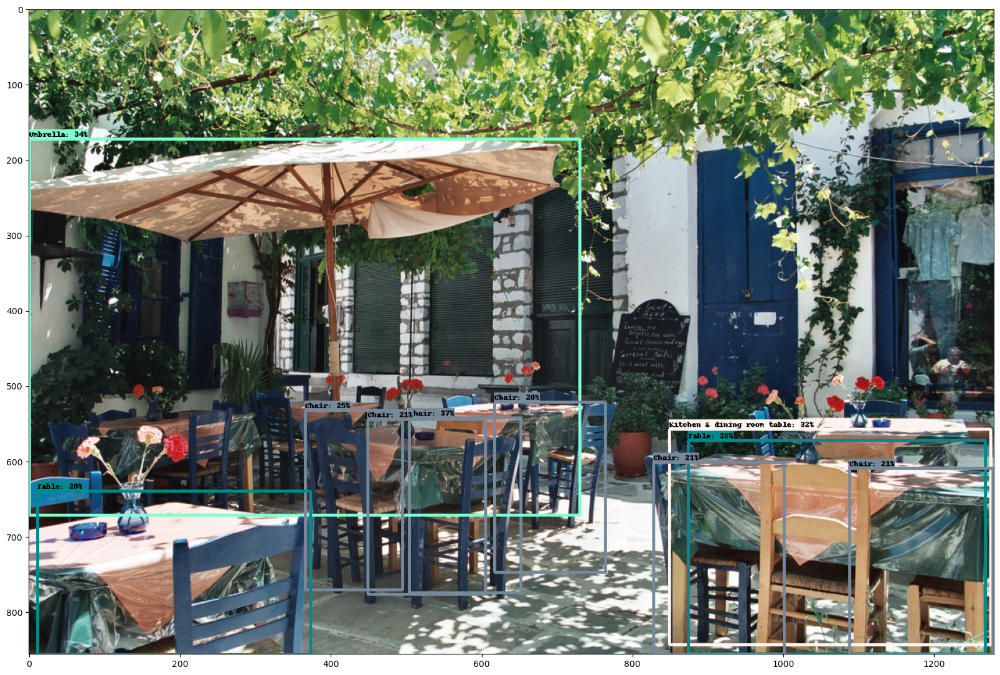

In [30]:
result = run_detector(detector, downloaded_image_path, True, 'img/Naxos_Taverna_result.jpg')

In [33]:
image_urls = [
    "https://upload.wikimedia.org/wikipedia/commons/8/8b/Christmas_table_%28Serbian_cuisine%29.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/7/7a/Capri_-_7224.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/a/a2/04-09-12-Schaupfl%C3%BCgen-Fahrenwalde-RalfR-IMG_1232.jpg"
  ]

def detect_img(image_url, download_to_local=False, save_img=False, img_name=None):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480, False, download_to_local)
    run_detector(detector, image_path, save_img, img_name)
    end_time = time.time()
    print("Inference time:",end_time-start_time)

/var/folders/yh/_x7knk010_jf8mn6y34t0cnc0000gn/T/ipykernel_48875/2973902239.py:45: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to Christmas_table_%28Serbian_cuisine%29.jpg.
Found 100 objects.
Inference time:  2.6092758178710938
Font not found, using default font.
Inference time: 3.360373020172119


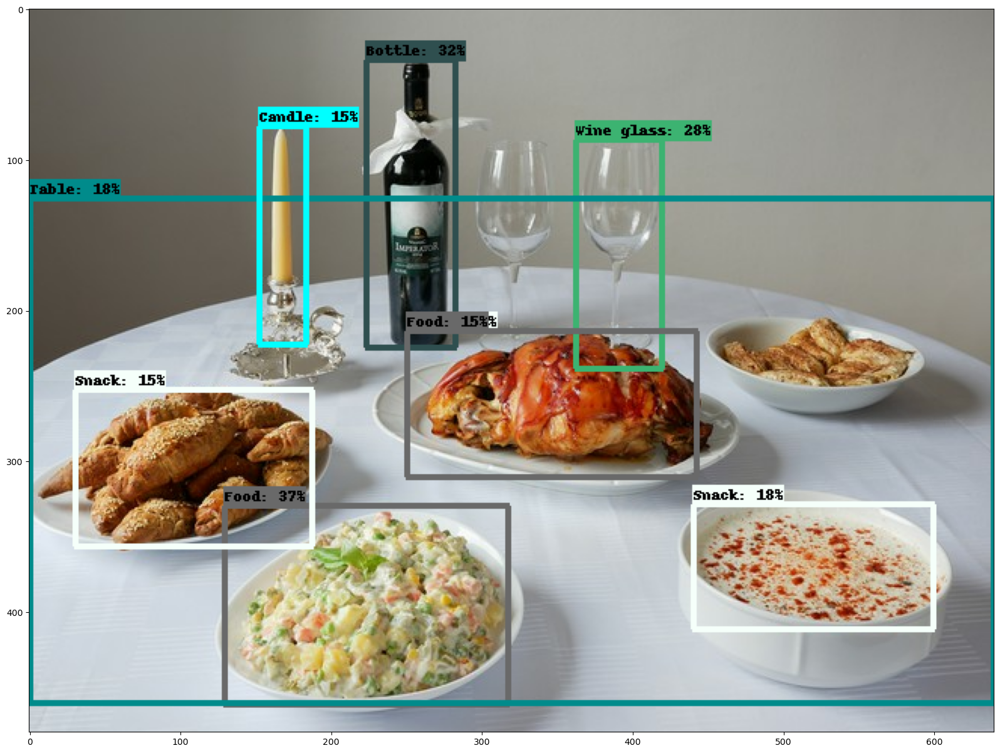

In [34]:
detect_img(image_urls[0], True, True, 'img/food_result.jpg')

/var/folders/yh/_x7knk010_jf8mn6y34t0cnc0000gn/T/ipykernel_48875/2973902239.py:45: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)


Image downloaded to /var/folders/yh/_x7knk010_jf8mn6y34t0cnc0000gn/T/tmpy2z5dsz9.jpg.
Found 100 objects.
Inference time:  2.433122158050537
Font not found, using default font.
Inference time: 2.7840940952301025


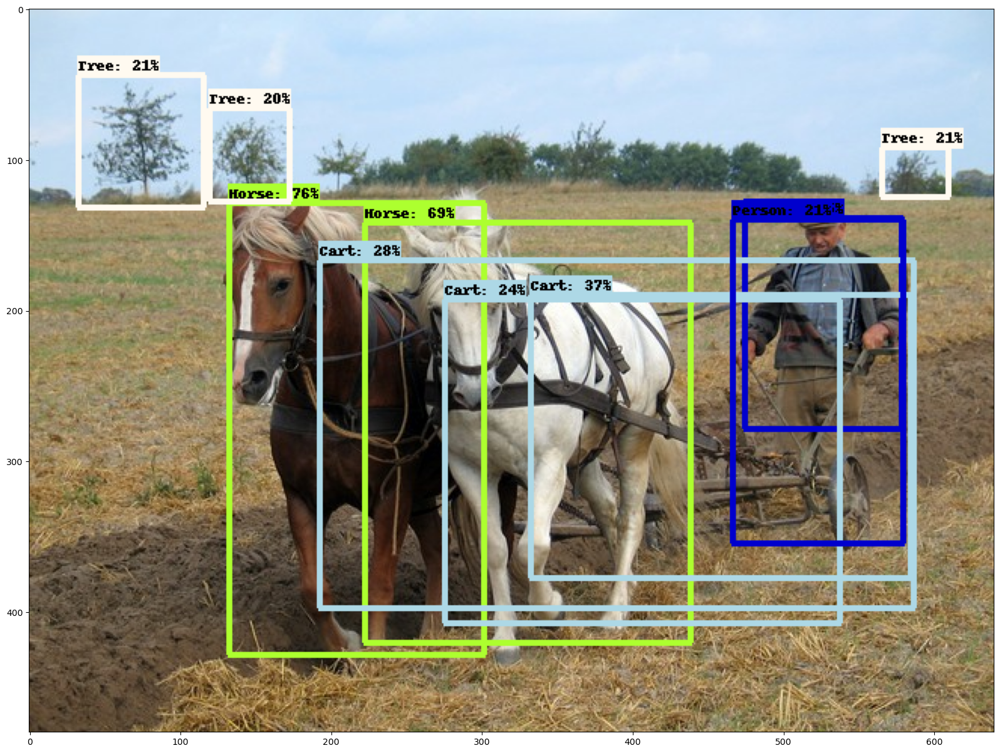

In [36]:
#one could see the result for other two pictures
# detect_img(image_urls[1])
detect_img(image_urls[2])